### This is a notebook for comparing predicted segmentation with ground truth segmentations (validation dataset)

In [34]:
from cellpose import utils, dynamics, metrics, plot, io
from numba import jit
from scipy.optimize import linear_sum_assignment
from scipy.ndimage import convolve, mean
import numpy as np
import matplotlib.pyplot as plt
import os

### Loading of *_seg.npy files which contains 

In [35]:
%cd ../../validation/

/dtu/blackhole/1d/203261/DL_project/Cell_Segmentation_DL_project/validation


In [37]:
import os, io
current_dir = os.getcwd()

# putting .npy files into a list and sorting the list
ground_truth = [file for file in os.listdir("ground_truth") if file.endswith(".npy")]    
cyto3_pred = [file for file in os.listdir("cyto3_predictions") if file.endswith(".npy")]
fined_tuned_pred = [file for file in os.listdir("fined_tuned_predictions") if file.endswith(".npy")] 
retrained2_pred = [file for file in os.listdir("retrained_predictions") if file.endswith(".npy")] 

ground_truth_npy = sorted(ground_truth)
cyto3_pred_npy = sorted(cyto3_pred)
fined_tuned_pred_npy = sorted(fined_tuned_pred)
retrained_pred_npy = sorted(retrained2_pred)

#print(ground_truth_npy)
#print(cyto3_pred_npy)

# loading each .npy file into a list and extract only the 'masks' field
groundtruth_masks = [np.load(os.path.join("ground_truth", file), allow_pickle=True).item()['masks'] for file in ground_truth]
predicted_masks = [np.load(os.path.join("cyto3_predictions", file), allow_pickle=True).item()['masks'] for file in cyto3_pred]

print("Number of .npy files loaded:", len(groundtruth_masks))

# accessing the 'masks' directly from the lists
masks_true, mask_pred = groundtruth_masks, predicted_masks

images_names = []
for file in retrained_pred_npy:
    images_names.append(file[:14])
print(images_names)

Number of .npy files loaded: 20
['tile_0003_0023', 'tile_0003_0024', 'tile_0003_0025', 'tile_0003_0027', 'tile_0009_0011', 'tile_0009_0012', 'tile_0027_0010', 'tile_0027_0011', 'tile_0027_0012', 'tile_0027_0013', 'tile_0027_0014', 'tile_0029_0008', 'tile_0029_0009', 'tile_0029_0010', 'tile_0029_0011', 'tile_0029_0012', 'tile_0029_0013', 'tile_0029_0014', 'tile_0029_0015', 'tile_0029_0016']


In [38]:
#!pip install scikit-image
from skimage import io

dat = np.load('ground_truth/tile_0003_0023_seg.npy', allow_pickle=True).item()
img = io.imread('ground_truth/tile_0003_0023.png')
dat.keys()

dict_keys(['outlines', 'colors', 'masks', 'chan_choose', 'filename', 'flows', 'ismanual', 'manual_changes', 'model_path', 'flow_threshold', 'cellprob_threshold', 'normalize_params', 'restore', 'ratio', 'diameter'])

In [39]:
import os

# Navigate to results folder
results_folder = "../results/"
os.makedirs(results_folder, exist_ok=True)
os.chdir(results_folder)  # Change directory to results

# Define and create the output folder
output_folder = "ground_truth_vs_predicted_masks"
if not os.path.exists(output_folder):
    os.makedirs(output_folder)
    print(f"Folder '{output_folder}' created successfully in {os.getcwd()}")
else:
    print(f"Folder '{output_folder}' already exists in {os.getcwd()}")

# Navigate back to validation folder
validation_folder = "../validation/"
os.makedirs(validation_folder, exist_ok=True)  # Ensure it exists
os.chdir(validation_folder)  # Change back to validation

print(f"Current directory: {os.getcwd()}")

Folder 'ground_truth_vs_predicted_masks' already exists in /dtu/blackhole/1d/203261/DL_project/Cell_Segmentation_DL_project/results
Current directory: /dtu/blackhole/1d/203261/DL_project/Cell_Segmentation_DL_project/validation


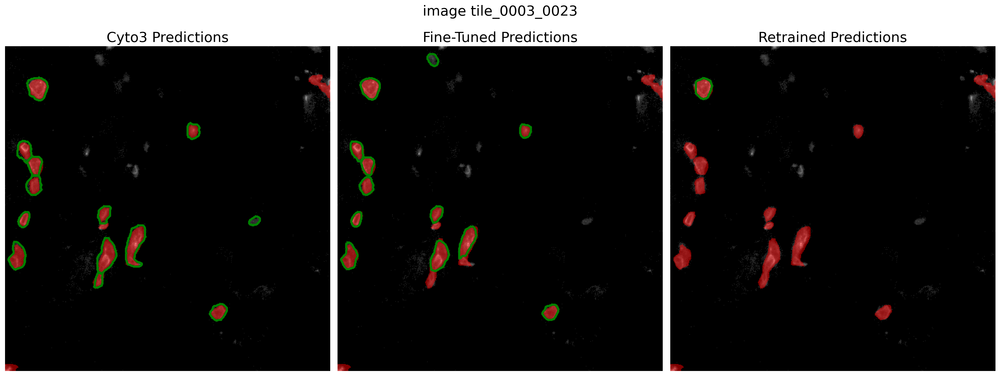

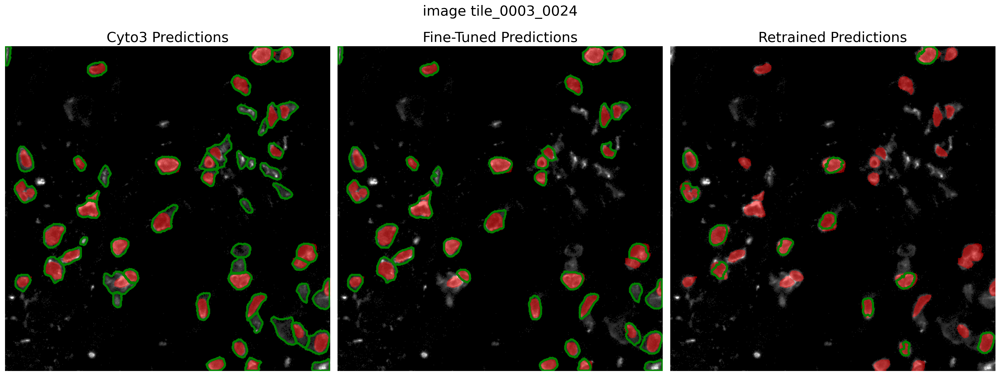

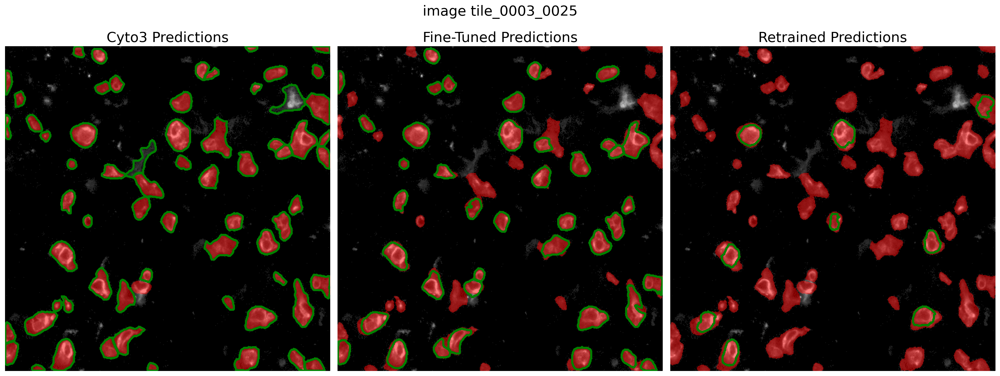

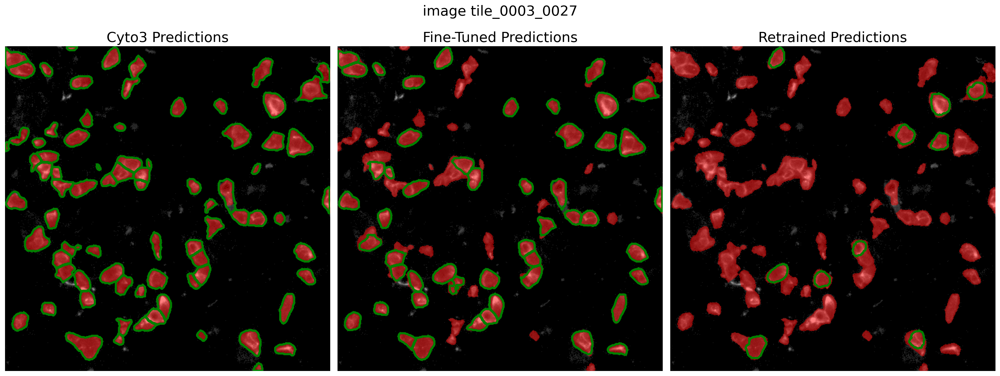

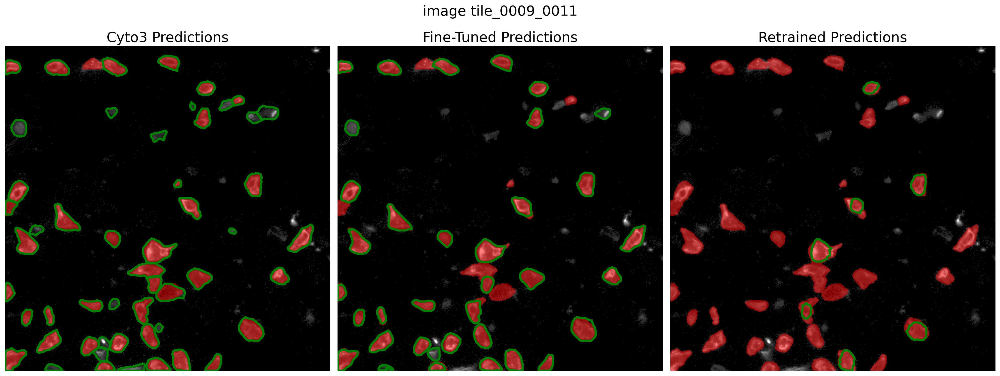

...

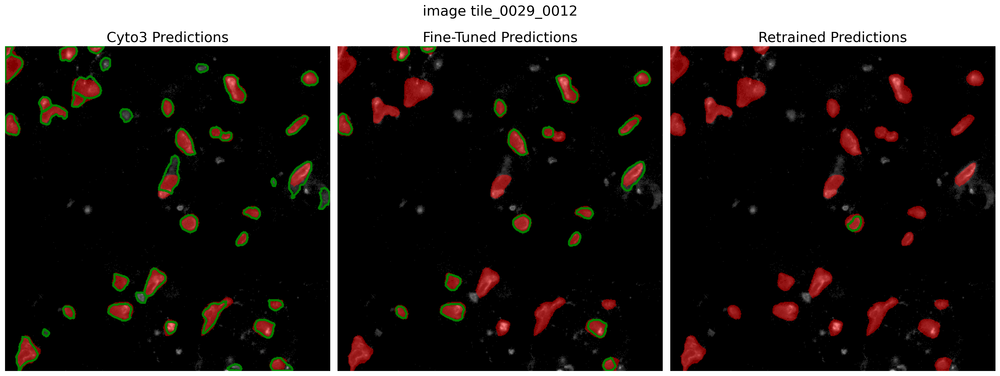

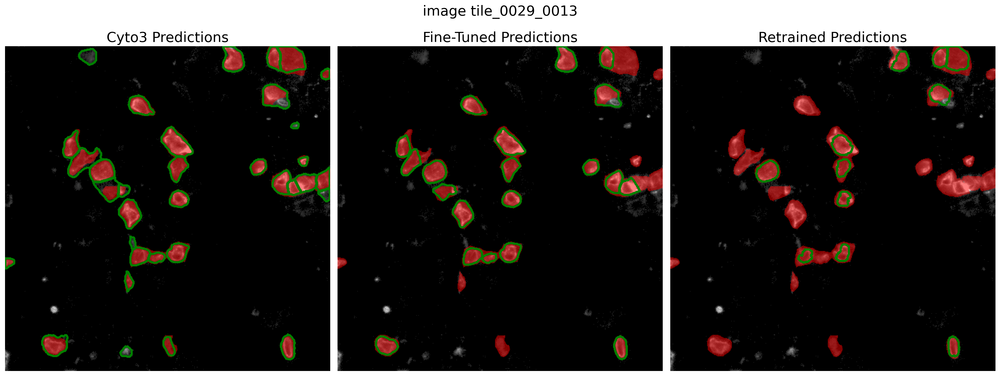

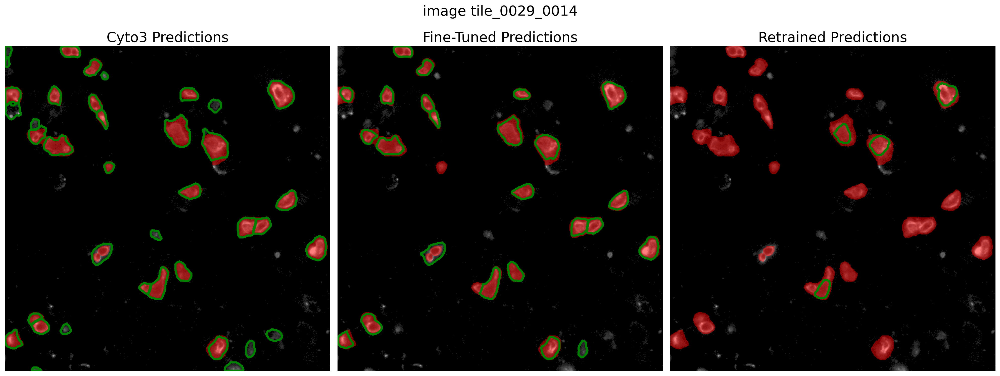

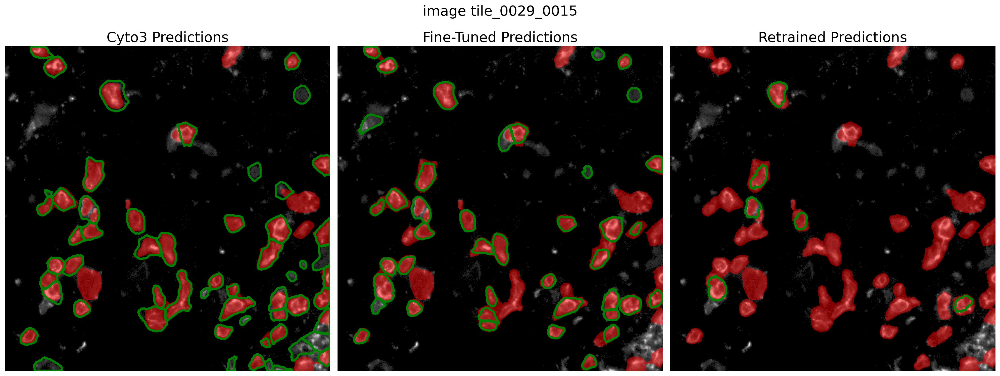

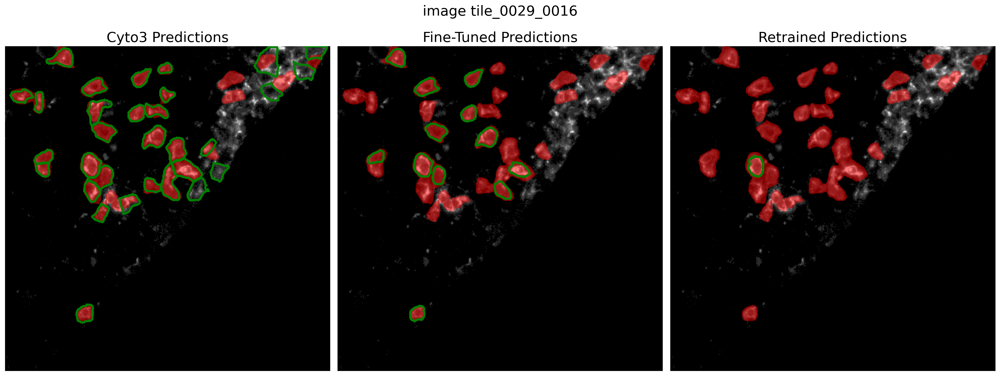

All images saved in the folder: ../results/ground_truth_vs_predicted_masks


In [40]:
from IPython.display import display, HTML
import numpy as np
from cellpose import utils
from PIL import Image
import matplotlib.pyplot as plt

output_folder = "../results/ground_truth_vs_predicted_masks"

# loading images
for tile in images_names:
    dat1 = np.load("ground_truth/" + tile + '_seg.npy', allow_pickle=True).item()
    dat2 = np.load("cyto3_predictions/" + tile + '_seg.npy', allow_pickle=True).item()
    dat3 = np.load("fined_tuned_predictions/" + tile + '_seg.npy', allow_pickle=True).item()
    dat4 = np.load("retrained_predictions/" + tile + '_seg.npy', allow_pickle=True).item()
    
    img_path = "ground_truth/" + tile + '.png'
    
    # load the PNG image
    image = Image.open(img_path)
    img = np.array(image)
    
    # create an RGB version of the grayscale image
    if len(img.shape) == 2:  # If the image is grayscale
        img_rgb = np.stack([img] * 3, axis=-1)
    else:  # If the image is already RGB
        img_rgb = img.copy()
    
    # set up the figure for the three plots
    plt.figure(figsize=(20, 8), dpi=200)  # Increase figure size and resolution
    
    # list of datasets for predictions
    data_list = [dat2, dat3, dat4]
    titles = ["Cyto3 Predictions", "Fine-Tuned Predictions", "Retrained Predictions"]
    
    # iterate through the datasets (Cyto3, Fine-Tuned, Retrained)
    for i, data in enumerate(data_list, 1):
        # Get the masks for the current dataset
        masks = data['masks']
    
        # create an RGB overlay for the current dataset
        overlay = img_rgb.copy()
        red_mask = np.zeros_like(img_rgb)
        red_mask[..., 0] = 255  # Red channel
    
        # apply the red mask where masks are nonzero
        overlay[dat1['masks'] > 0] = red_mask[dat1['masks'] > 0]
    
        # blend the original image and the red mask (optional transparency)
        alpha = 0.5  # Transparency factor (0 = completely transparent, 1 = completely opaque)
        blended = (img_rgb * (1 - alpha) + overlay * alpha).astype(np.uint8)
    
        # plot the blended image for the current dataset
        #image_title = titles[i - 1] + "image " + str(retrained_pred_npy[i][:14])
        plt.subplot(1, 3, i)
        plt.imshow(blended)
        plt.title(titles[i - 1], fontsize=20)
        plt.axis('off')
    
        # plot the outlines on top of the blended image
        outlines = utils.outlines_list(masks)
        for o in outlines:
            plt.plot(o[:, 0], o[:, 1], color='g', linewidth=3)
            
    plt.suptitle("image " + str(tile[:14]), fontsize=20)
    plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)
    
    plt.tight_layout()
    
    output_path = os.path.join(output_folder, f"{tile}_comparison.png")
    plt.savefig(output_path, bbox_inches='tight', dpi=300)
    
    plt.show()    
    plt.close()

print(f"All images saved in the folder: {output_folder}")

In [41]:
%cd ../results/ground_truth_vs_predicted_masks/

/dtu/blackhole/1d/203261/DL_project/Cell_Segmentation_DL_project/results/ground_truth_vs_predicted_masks


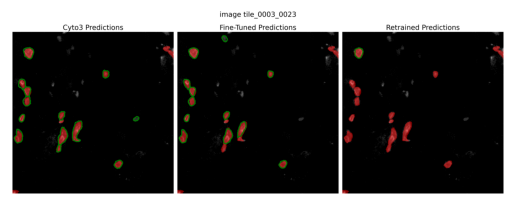

In [42]:
# File path
file_path = 'tile_0003_0023_comparison.png'

# Open the image
image = Image.open(file_path)

# Display the image
plt.imshow(image)
plt.axis('off')  # Hide axes
plt.show()